In [2]:
# Cai dat thu vien
from PIL import Image
from skimage.io import imread, imshow, show
import scipy.fftpack as fp
from scipy import ndimage, misc, signal
# from scipy.stats import signaltonoise
from skimage import data, img_as_float
from skimage.color import rgb2gray
from skimage.transform import rescale
import matplotlib.pylab as pylab
import numpy as np
import scipy.fft as fftpack
import timeit

# ĐỊNH LÝ TÍCH CHẬP VÀ LÀM MỜ MIỀN TẦN SỐ GAUSS

## Ứng dụng của định lý tích chập (convolution)
- Định lý tích chập nói rằng tích chập trong miền ảnh tương đương với phép nhân đơn giản trong miền tần số (ảnh trang 110/483)
- Ảnh trang 111/483 đưa ra các bước cơ bản trong việc lọc miền tần số. Ta có ảnh gốc F và một kernel (một mask hay một hàm giảm thiểu/tăng cường) làm đầu vào. Trước tiên cả hai đều được chuyển sang miền tần số sử dụng DFT, rồi mới áp dụng tích chập (đơn thuần là phép nhân). Đầu ra là ảnh đã sử dụng tích chập trong miền tần số, sau đó sử dụng IDFT để lấy ảnh được phục dựng.

C:\Users\ACER\AppData\Local\Temp\ipykernel_25928\3137602113.py:30: ComplexWarning: Casting complex values to real discards the imaginary part
  fp.fftshift(freq))).astype(int))
C:\Users\ACER\AppData\Local\Temp\ipykernel_25928\3137602113.py:33: ComplexWarning: Casting complex values to real discards the imaginary part
  fp.fftshift(freq_kernel))).astype(int))
C:\Users\ACER\AppData\Local\Temp\ipykernel_25928\3137602113.py:35: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.imshow( (20*np.log10( 0.1 + fp.fftshift(convolved))).astype(int))


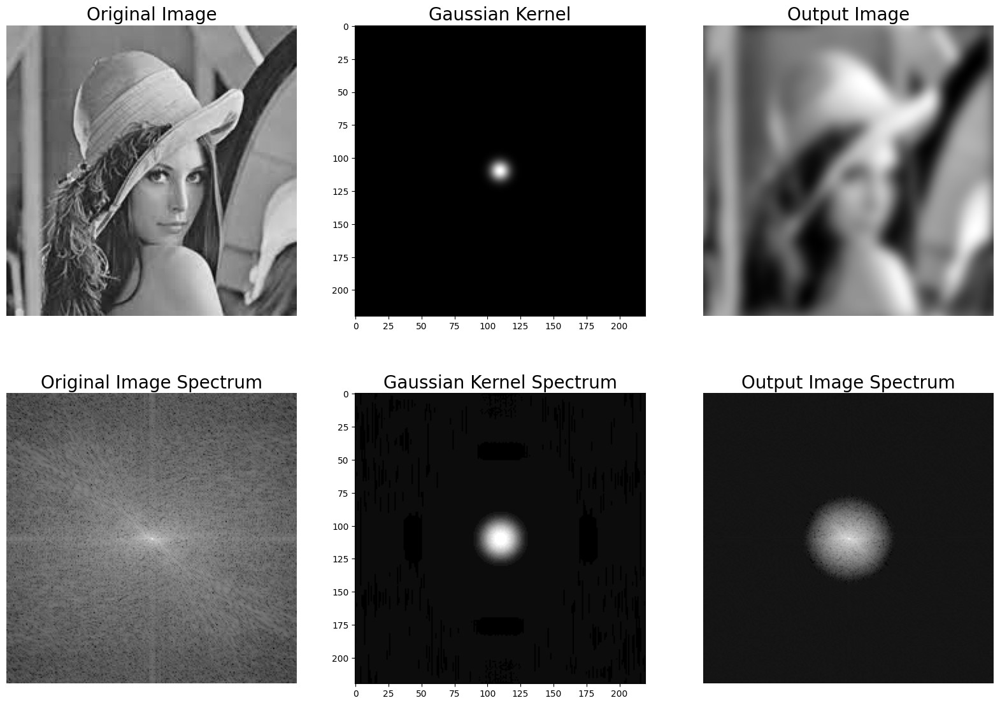

In [ ]:
'''
Bộ lọc làm mờ Gaussian miền tần số với numpy fft
- Đoạn code sau cho thấy cách áp dụng bộ lọc Gauss trong miền tần số sử dụng định
lý tích chập và numpy fft
'''
# ----------------------------------------------------------------------
'''
GIẢI THÍCH ĐOẠN CODE DƯỚI:
- Hàm gaussian_kernel tạo ra một kernel Gaussian 2D với kích thước (size_x, 
size_y) và độ lệch chuẩn sigma:
+ np.linspace: Tạo các điểm dữ liệu cách đều nhau trong khoảng từ -size_x // 2 
đến size_x // 2
+ np.meshgrid: Tạo lưới tọa độ 2D từ các vector x và y
+ np.exp(-(x**2 + y**2) / (2 * sigma**2)): Tính toán phân phối Gaussian trên 
lưới tọa độ
+ kernel / kernel.sum(): Chuẩn hóa kernel để tổng các phần tử bằng 1.

- Tính biến đổi Fourier của hình ảnh: freq = fp.fft2(im)
+ fp.fft2(im) Tính biến đổi Fourier 2D của hình ảnh gốc im.
+ Biến đổi Fourier chuyển hình ảnh từ miền không gian sang miền tần số, giúp 
thực hiện phép tích chập bằng phép nhân

- Biến đổi Fourier của kernel Gaussian: freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
+ fp.ifftshift(gauss_kernel): Dịch chuyển kernel để tâm của nó ở góc phần tư 
đầu tiên (để khớp với miền tần số).
+ fp.fft2(...): Tính biến đổi Fourier của kernel Gaussian

- Tích chập trong miền tần số: convolved = freq * freq_kernel
+ Nhờ định lý tích chập, tích chập trong miền không gian tương đương với phép 
nhân trong miền tần số.
+ freq * freq_kernel: Phép nhân điểm từng phần tử giữa các giá trị Fourier của 
hình ảnh và kernel Gaussian.

- Biến đổi ngược Fourier để lấy ảnh sau khi tích chập:im1 = fp.ifft2(convolved).real
+ fp.ifft2(convolved): Tính biến đổi Fourier ngược của convolved, chuyển kết 
quả từ miền tần số về miền không gian.
+ .real: Lấy phần thực của kết quả (phần ảo có thể là nhiễu)
- Hiển thị kết quả
'''
def gaussian_kernel(size_x, size_y, sigma=5):
  """Create a Gaussian kernel."""
  x = np.linspace(-size_x // 2, size_x // 2, size_x)
  y = np.linspace(-size_y // 2, size_y // 2, size_y)
  x, y = np.meshgrid(x, y)
  kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
  return kernel / kernel.sum()

pylab.figure(figsize=(20,15))
pylab.gray() # show the filtered result in grayscale
im = np.mean(imread('../../image/lena.jpg'), axis=2)
gauss_kernel = gaussian_kernel(im.shape[0], im.shape[1], sigma=5)
freq = fp.fft2(im)
assert(freq.shape == gauss_kernel.shape)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
convolved = freq*freq_kernel # by the convolution theorem, simply multiply in the frequency domain
im1 = fp.ifft2(convolved).real
pylab.subplot(2,3,1), pylab.imshow(im), pylab.title('Original Image',
size=20), pylab.axis('off')
pylab.subplot(2,3,2), pylab.imshow(gauss_kernel), pylab.title('Gaussian Kernel', size=20)
pylab.subplot(2,3,3), pylab.imshow(im1) # the imaginary part is an artifact
pylab.title('Output Image', size=20), pylab.axis('off')
pylab.subplot(2,3,4), pylab.imshow( (20*np.log10( 0.1 +
fp.fftshift(freq))).astype(int))
pylab.title('Original Image Spectrum', size=20), pylab.axis('off')
pylab.subplot(2,3,5), pylab.imshow( (20*np.log10( 0.1 +
fp.fftshift(freq_kernel))).astype(int))
pylab.title('Gaussian Kernel Spectrum', size=20), pylab.subplot(2,3,6)
pylab.imshow( (20*np.log10( 0.1 + fp.fftshift(convolved))).astype(int))
pylab.title('Output Image Spectrum', size=20), pylab.axis('off')
pylab.subplots_adjust(wspace=0.2, hspace=0)
pylab.show()

## Gaussian kernel trong miền tần số

### Gaussian LPF kernel spectrum in 2D
- Đoạn code tiếp theo cho thấy cách vẽ phổ của kernel Gaussian trong không gian 2 chiều bằng phép biến đổi logarith:

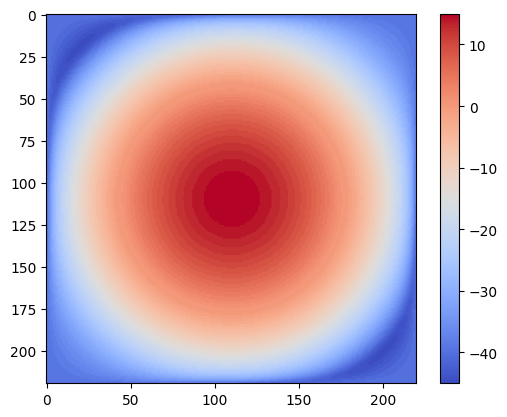

In [27]:
from scipy.signal import windows
im = rgb2gray(imread('../../image/lena.jpg'))
gauss_kernel =  np.outer(windows.gaussian(im.shape[0], 1),
                        windows.gaussian(im.shape[1], 1))
freq = fp.fft2(im)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
pylab.imshow( (20*np.log10( 0.01 +
fp.fftshift(freq_kernel))).real.astype(int), cmap='coolwarm') 
# 0.01 is added to keep the argument to log function always positive
pylab.colorbar()
pylab.show()

Vì Gaussian kernel là bộ lọc thông thấp nên phổ tần số của nó có giá trị cao hơn đối với các tần số ở trung tâm (cho phép nhiều giá trị tần số thấp hơn) và giảm dần khi di chuyển ra xa trung tâm đến các giá trị tần số cao hơn

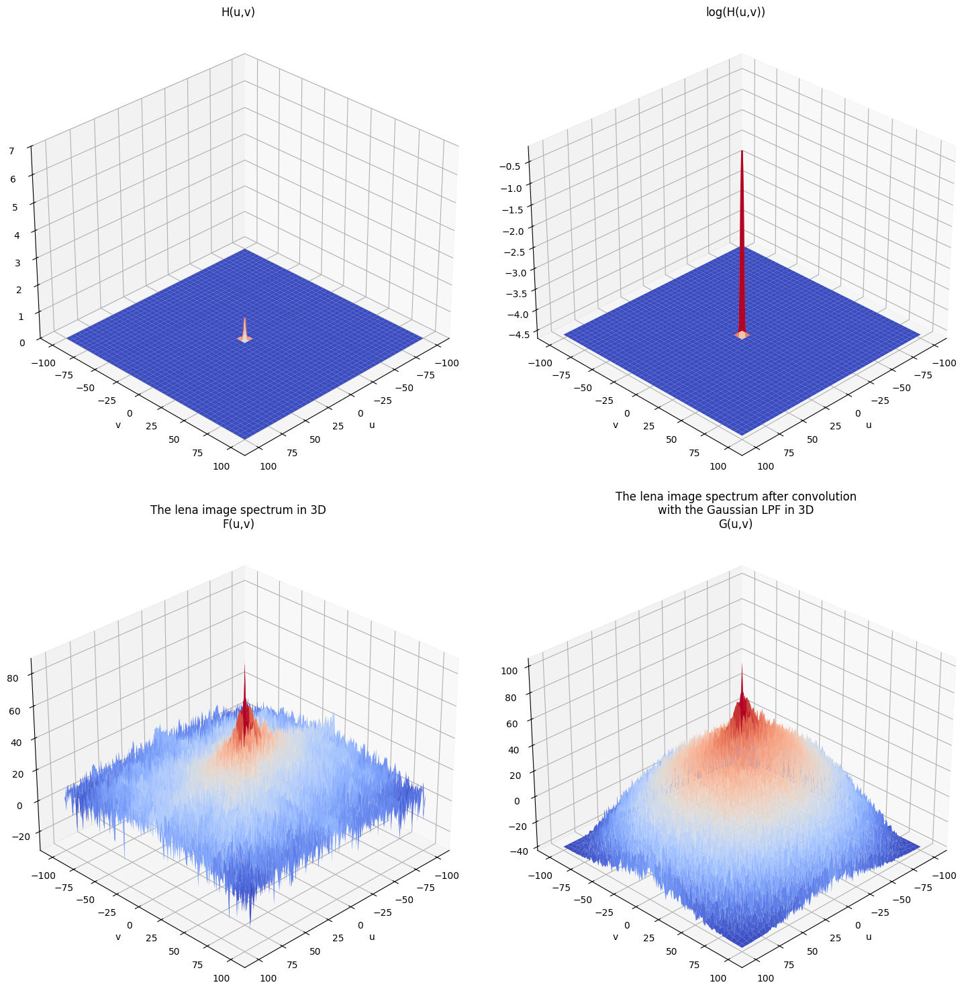

In [3]:
import numpy as np
from scipy.signal import windows
from scipy.fftpack import fft2, fftshift, ifftshift
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from skimage.io import imread
from skimage.color import rgb2gray

# Read and process image
im = rgb2gray(imread('../../image/lena.jpg'))

# Create Gaussian kernel
gauss_kernel = np.outer(windows.gaussian(im.shape[0], 1),
                       windows.gaussian(im.shape[1], 1))

# Compute FFTs
freq = fft2(im)
freq_kernel = fft2(ifftshift(gauss_kernel))

# Create coordinate grid for 3D plotting
x = np.linspace(-100, 100, im.shape[0])
y = np.linspace(-100, 100, im.shape[1])
X, Y = np.meshgrid(x, y)

# Create figure with 2x2 subplots
fig = plt.figure(figsize=(15, 15))

# Plot 1: H(u,v) - Gaussian kernel
ax1 = fig.add_subplot(221, projection='3d')
surf1 = ax1.plot_surface(X, Y, gauss_kernel, cmap='coolwarm')
ax1.set_title('H(u,v)')
ax1.set_zlim(0, 7)

# Plot 2: log(H(u,v)) - Log of Gaussian kernel
ax2 = fig.add_subplot(222, projection='3d')
log_kernel = np.log(gauss_kernel + 0.01)  # Add 0.01 to avoid log(0)
surf2 = ax2.plot_surface(X, Y, log_kernel, cmap='coolwarm')
ax2.set_title('log(H(u,v))')

# Plot 3: Original image spectrum
ax3 = fig.add_subplot(223, projection='3d')
spectrum = 20 * np.log10(0.01 + np.abs(fftshift(freq)))
surf3 = ax3.plot_surface(X, Y, spectrum, cmap='coolwarm')
ax3.set_title('The lena image spectrum in 3D\nF(u,v)')

# Plot 4: Filtered spectrum
ax4 = fig.add_subplot(224, projection='3d')
filtered_spectrum = 20 * np.log10(0.01 + np.abs(fftshift(freq * freq_kernel)))
surf4 = ax4.plot_surface(X, Y, filtered_spectrum, cmap='coolwarm')
ax4.set_title('The lena image spectrum after convolution\nwith the Gaussian LPF in 3D\nG(u,v)')

# Adjust view angles for all subplots
for ax in [ax1, ax2, ax3, ax4]:
    ax.view_init(elev=30, azim=45)
    ax.set_xlabel('u')
    ax.set_ylabel('v')

# Adjust layout
plt.tight_layout()
plt.show()

## BỘ LỌC LÀM MỜ GAUSSIAN MIỀN TẦN SỐ VỚI SCIPY SIGNAL.FFTCONVOLVE()
- Đoạn code sau cho thấy cách hàm fftconvolve() được dùng để thực hiện tích chập trong miền tần số:

(224, 225)


C:\Users\ACER\AppData\Local\Temp\ipykernel_4708\3097479881.py:17: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


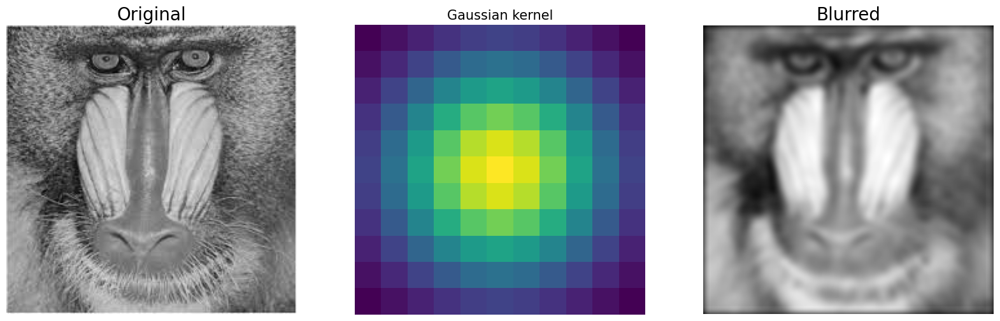

In [ ]:
'''
GIẢI THÍCH ĐOẠN CODE:
- gauss_kernel: Tạo một Gaussian kernel 2D có kích thước 11x11 với độ lệch 
chuẩn sigma = 3 bằng cách lấy tích ngoài của hai Gaussian kernel 1D. Gaussian 
kernel này sẽ được sử dụng để làm mờ ảnh
+ windows.gaussian(11, 3) tạo một Gaussian kernel 1D có 11 phần tử và sigma=3
+ np.outer(...) lấy tích ngoài của hai Gaussian kernel 1D để tạo ra một Gaussian kernel 2D

- im_blurred: Áp dụng convolution giữa ảnh im và Gaussian kernel gauss_kernel 
bằng cách sử dụng hàm fftconvolve từ scipy.signal. fftconvolve thực hiện phép 
tích chập trong miền tần số (sử dụng biến đổi Fourier) để tăng tốc độ tính 
toán so với tích chập trong miền không gian.
+ mode='same': Đảm bảo rằng kích thước của ảnh đầu ra im_blurred khớp với kích 
thước của ảnh đầu vào im

- fig, (ax_original, ax_kernel, ax_blurred) = pylab.subplots(1, 3, figsize=(20,8)): 
Tạo một figure (fig) và ba subplot (ax_original, ax_kernel, ax_blurred) xếp 
thành một hàng với kích thước toàn bộ là 20x8 inch. Các subplot này sẽ dùng 
để hiển thị các ảnh khác nhau
- ax_original: Hiển thị ảnh gốc im dưới dạng thang xám (grayscale).
- ax_kernel: Hiển thị Gaussian kernel gauss_kernel.
- ax_blurred: Hiển thị ảnh đã được làm mờ im_blurred dưới dạng thang xám
'''
im = np.mean(imread('../../image/mandrill.jpg'), axis=2)
print(im.shape)
# (224, 225)
gauss_kernel = np.outer(windows.gaussian(11, 3), windows.gaussian(11, 3)) # 2D Gaussian kernel of size 11x11 with σ = 3
im_blurred = signal.fftconvolve(im, gauss_kernel, mode='same')
fig, (ax_original, ax_kernel, ax_blurred) = pylab.subplots(1, 3,
figsize=(20,8))
ax_original.imshow(im, cmap='gray')
ax_original.set_title('Original', size=20)
ax_original.set_axis_off()
ax_kernel.imshow(gauss_kernel)
ax_kernel.set_title('Gaussian kernel', size=15)
ax_kernel.set_axis_off()
ax_blurred.imshow(im_blurred, cmap='gray')
ax_blurred.set_title('Blurred', size=20)
ax_blurred.set_axis_off()
fig.show()

Đoạn code tiếp theo cho thấy cách vẽ phổ ảnh gốc và ảnh làm mờ sau khi tính tích chập

C:\Users\ACER\AppData\Local\Temp\ipykernel_4708\427220387.py:5: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.subplot(1,2,1), pylab.imshow((20*np.log10( 0.1 + F2)).astype(int),
C:\Users\ACER\AppData\Local\Temp\ipykernel_4708\427220387.py:10: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.subplot(1,2,2), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int),


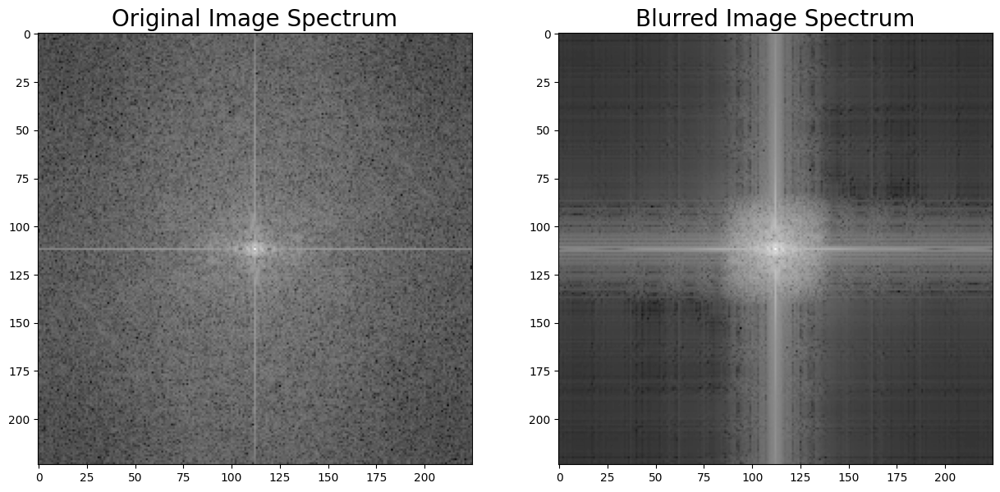

In [ ]:
'''
GIẢI THÍCH ĐOẠN CODE DƯỚI:
- F1 = fftpack.fft2((im).astype(float)):
+ Thực hiện phép biến đổi Fourier 2 chiều (fft2) trên ảnh gốc im, sau khi 
chuyển đổi ảnh sang kiểu float. Phép biến đổi Fourier 2 chiều chuyển đổi dữ 
liệu không gian (ảnh) sang miền tần số.
+ Kết quả F1 là phổ tần số của ảnh gốc dưới dạng một ma trận phức, chứa cả 
thông tin về biên độ và pha ở mỗi tần số.
- F2 = fftpack.fftshift(F1): Sử dụng hàm fftshift để dịch chuyển các thành 
phần tần số thấp (gần giá trị không) về trung tâm của phổ tần số, giúp dễ dàng 
quan sát phổ tần số của ảnh

- pylab.imshow((20*np.log10(0.1 + F2)).astype(int), cmap=pylab.cm.gray):
+ Sử dụng hàm np.log10 để lấy logarit của phổ tần số. Logarit thường được sử 
dụng để làm rõ các chi tiết trong miền tần số, vì phổ tần số có xu hướng có 
giá trị rất lớn
+ (0.1 + F2): Thêm một giá trị nhỏ (0.1) để tránh log của 0 và giúp việc hiển 
thị phổ tần số ổn định hơn.
+ Nhân với 20 để chuyển đổi biên độ tần số sang đơn vị decibel (dB), giúp dễ 
dàng quan sát các khác biệt về tần số.
+ Sau đó chuyển đổi kết quả sang kiểu int để hiển thị ảnh và hiển thị phổ 
tần số dưới dạng ảnh thang xám (grayscale).

- F1 = fftpack.fft2((im_blurred).astype(float)):
+ Thực hiện phép biến đổi Fourier 2 chiều trên ảnh đã làm mờ im_blurred, tương 
tự như đối với ảnh gốc.
+ F1 chứa phổ tần số của ảnh đã làm mờ

- F2 = fftpack.fftshift(F1): dịch chuyển phổ tần số để đưa các thành phần 
tần số thấp về trung tâm
'''
import scipy.fftpack as fftpack
F1 = fftpack.fft2((im).astype(float))
F2 = fftpack.fftshift( F1 )
pylab.figure(figsize=(15,8))
pylab.subplot(1,2,1), pylab.imshow((20*np.log10( 0.1 + F2)).astype(int),
cmap=pylab.cm.gray)
pylab.title('Original Image Spectrum', size=20)
F1 = fftpack.fft2((im_blurred).astype(float))
F2 = fftpack.fftshift( F1 )
pylab.subplot(1,2,2), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int),
cmap=pylab.cm.gray)
pylab.title('Blurred Image Spectrum', size=20)
pylab.show()

## SO SÁNH RUNTIME CỦA SCIPY CONVOLVE() VÀ FFTCONVOLVE() VỚI KERNEL GAUSSIAN MỜ
- Chúng ta có thể sử dụng mô-đun timeit của Python để so sánh thời gian chạy của các hàm tích chập miền hình ảnh và các hàm tích chập miền tần số. Vì tích chập miền tần số liên quan đến phép nhân ma trận đơn thay vì một loạt các phép tính số học cửa sổ trượt, nên dự kiến ​​sẽ nhanh hơn nhiều

(224, 225)


(<Axes: title={'center': 'ffconvolve Output'}>,
 Text(0.5, 1.0, 'ffconvolve Output'),
 (np.float64(-0.5), np.float64(224.5), np.float64(223.5), np.float64(-0.5)))

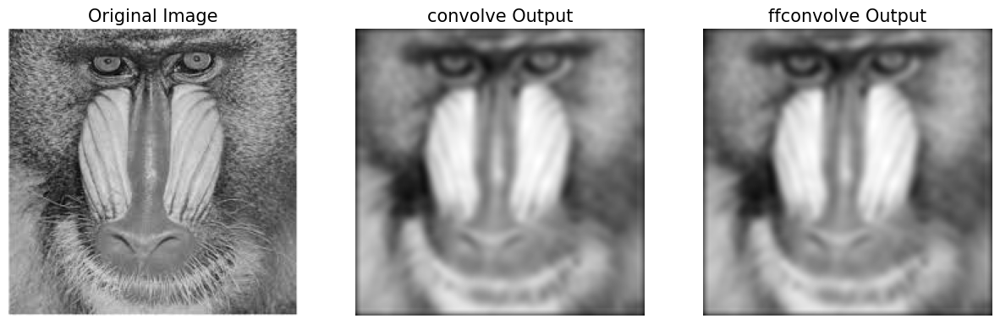

In [6]:
from scipy.signal import windows
im = np.mean(imread('../../image/mandrill.jpg'), axis=2)
print(im.shape)
# (224, 225)
gauss_kernel = np.outer(windows.gaussian(11, 3), windows.gaussian(11, 3)) # 2D Gaussian kernel of size 11x11 with σ = 3
im_blurred1 = signal.convolve(im, gauss_kernel, mode="same")
im_blurred2 = signal.fftconvolve(im, gauss_kernel, mode='same')
def wrapper_convolve(func):
  def wrapped_convolve():
    return func(im, gauss_kernel, mode="same")
  return wrapped_convolve
wrapped_convolve = wrapper_convolve(signal.convolve)
wrapped_fftconvolve = wrapper_convolve(signal.fftconvolve)
times1 = timeit.repeat(wrapped_convolve, number=1, repeat=100)
times2 = timeit.repeat(wrapped_fftconvolve, number=1, repeat=100)

# Đoạn code sau cho thấy ảnh gốc Mandrill, cũng như những bức ảnh bị làm mờ
# sử dụng cả hai hàm:
pylab.figure(figsize=(15,5))
pylab.gray()
pylab.subplot(131), pylab.imshow(im), pylab.title('Original Image',size=15), pylab.axis('off')
pylab.subplot(132), pylab.imshow(im_blurred1), pylab.title('convolve Output', size=15), pylab.axis('off')
pylab.subplot(133), pylab.imshow(im_blurred2), pylab.title('ffconvolve Output', size=15),pylab.axis('off')

Đầu ra của đoạn mã trước được hiển thị trong ảnh chụp màn hình sau. Như mong đợi, cả hai hàm convolve() và fftconvolve() đều cho ra cùng một hình ảnh đầu ra bị làm mờ như trên

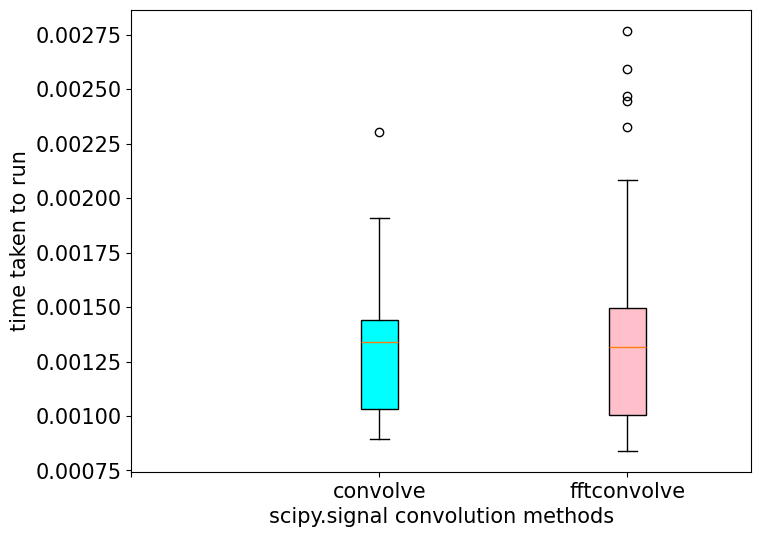

In [7]:
'''
Đoạn code sau trực quan hóa sự khác biệt giữa các runtime. Mỗi hàm được chạy
cùng trên ảnh đầu ra với cùng Gaussian kernel 100 lần và rồi vẽ biểu đồ hộp về 
thời gian thực hiện cho mỗi hàm
'''
data = [times1, times2]
pylab.figure(figsize=(8,6))
box = pylab.boxplot(data, patch_artist=True) #notch=True,
colors = ['cyan', 'pink']
for patch, color in zip(box['boxes'], colors):
  patch.set_facecolor(color)
pylab.xticks(np.arange(3), ('', 'convolve', 'fftconvolve'), size=15)
pylab.yticks(fontsize=15)
pylab.xlabel('scipy.signal convolution methods', size=15)
pylab.ylabel('time taken to run', size = 15)
pylab.show()

# LỌC TRONG MIỀN TẦN SỐ (HPF, LPF, BPF, và NOTCH FILTERS)
- Bước tiếp theo trong việc thu thập hình ảnh là tiền xử lý hình ảnh. Ảnh hay bị nhiễu bởi các yếu tố ngoại lai trong cường độ và độ sáng thay đổi ngẫu nhiên hoặc có độ tương phản kém, do đó không thể sử dụng trực tiếp và cần được cải thiện. Đây là lúc các bộ lọc được sử dụng

## FILTER là gì?

Filtering đề cập tới việc chuyển đổi các giá trị cường độ điểm ảnh để hiển thị các đặc điểm hình ảnh nhất định như:
* Tăng cường: Đặc điểm hình ảnh này cải thiện độ tương phản
* Làm mịn: Đặc điểm hình ảnh này loại bỏ nhiễu
* So khớp mẫu: Đặc điểm hình ảnh này phát hiện các mẫu đã biết

Hình ảnh đã lọc được mô tả bằng phép tích chập rời rạc và bộ lọc được mô tả bằng mặt nạ tích chập rời rạc n x n

### HIGH-PASS FILTER (HPF)

Bộ lọc này chỉ cho phép các tần số cao từ biểu diễn miền tần số của hình ảnh (thu được bằng DFT) và chặn tất cả các tần số thấp vượt quá giá trị cắt (cut-off value). Hình ảnh được tái tạo bằng DFT nghịch đảo và vì các thành phần tần số cao tương ứng với các cạnh, chi tiết, nhiễu, v.v., nên HPF có xu hướng trích xuất hoặc tăng cường chúng

Chúng ta có thể triển khai một HPF trên một ảnh với các bước sau:
* Áp dụng 2D FFT với scipy.fftpack fft2 và lấy miền tần số của hình ảnh
* Chỉ giữ các thành phần tần số cao (Loại bỏ các thành phần tần số thấp)
* Áp dụng FFT nghịch đảo để tái tạo ảnh

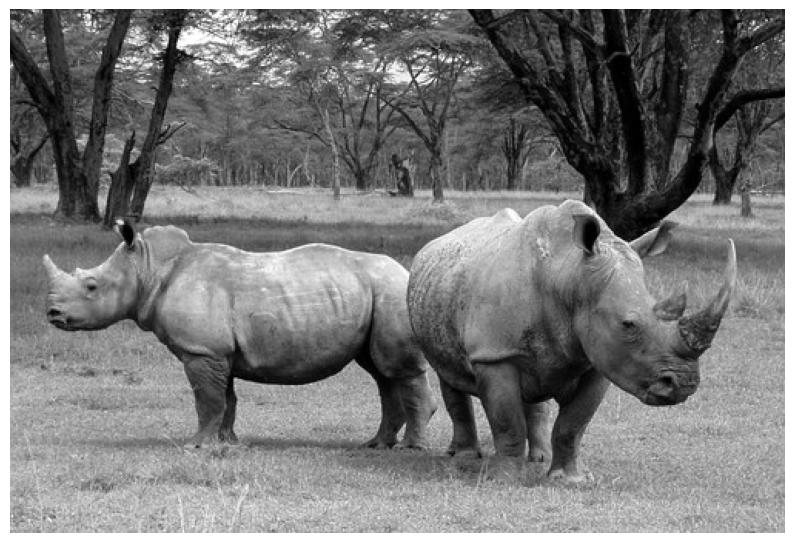

((np.float64(-0.5), np.float64(502.5), np.float64(339.5), np.float64(-0.5)),
 None)

In [9]:
'''
Đoạn code sau khởi tạo HPF. Có thể thấy các thành phần tần số cao tương xứng 
với các cạnh của hình ảnh và thông tin hình ảnh trung bình (phẳng) bị mất khi 
chúng ta loại bỏ ngày càng nhiều thành phần tần số thấp.
'''
im = np.array(Image.open('../../image/rhino.jpg').convert('L'))
pylab.figure(figsize=(10,10)), pylab.imshow(im, cmap=pylab.cm.gray),
pylab.axis('off'), pylab.show()

C:\Users\ACER\AppData\Local\Temp\ipykernel_22724\3218156465.py:10: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int)), pylab.show()


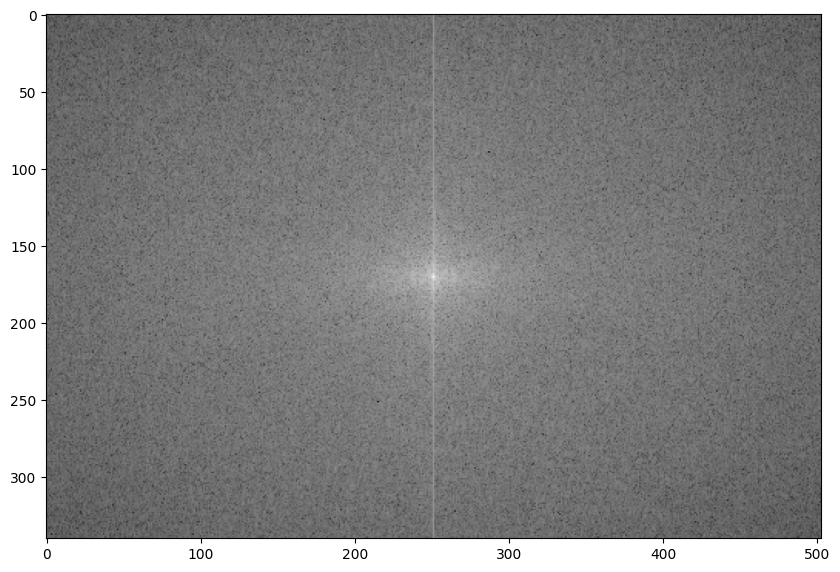

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [ ]:
'''
Đoạn code sau cho thấy cho thấy cách vẽ phổ hình ảnh tê giác gốc trong miền 
logarit
'''
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
freq1 = np.copy(freq)
freq2 = fp.fftshift(freq1)
pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int)), pylab.show()




C:\Users\ACER\AppData\Local\Temp\ipykernel_22724\457694996.py:7: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int))


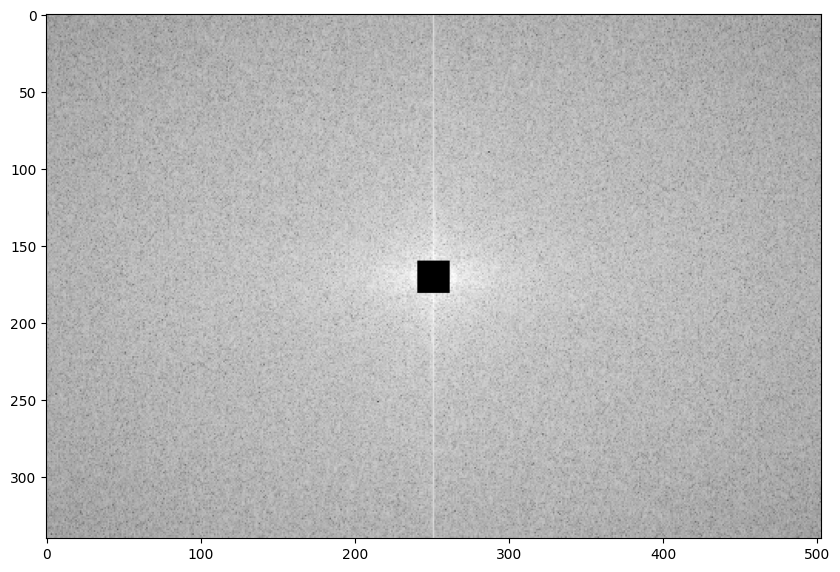

In [12]:
'''Đoạn code sau cho thấy cách áp dụng HPF bằng việc chặn các tần số thấp
trong mảng NumPy2D'''
# apply HPF
freq2[half_w-10:half_w+11,half_h-10:half_h+11] = 0 
# select all but the first 20x20 (low) frequencies
pylab.figure(figsize=(10,10))
pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int))
pylab.show()

Đoạn code sau cho thấy cách lấy lại hình ảnh từ phổ trước bằng cách áp dụng ifft2():

2.399499559258309


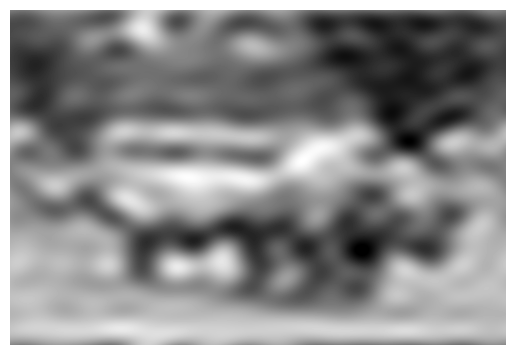

(<matplotlib.image.AxesImage at 0x2d015033d90>,
 (np.float64(-0.5), np.float64(502.5), np.float64(339.5), np.float64(-0.5)),
 None)

In [8]:
import scipy.fft as fftpack
def signaltonoise(a, axis=0, ddof=0):
  mean = np.mean(a, axis=axis)
  std_dev = np.std(a, axis=axis, ddof=ddof)
  return np.where(std_dev == 0, 0, mean / std_dev)

im1 = np.clip(fp.ifft2(fftpack.ifftshift(freq2)).real,0,255) 
# clip pixel values after IFFT
print(signaltonoise(im1, axis=None))
# 0.5901647786775175
pylab.imshow(im1, cmap='gray'), pylab.axis('off'), pylab.show()

Bây giờ hãy xem giá trị cắt tần số (frequency cutoff value) cho một HPF thay đổi hình ảnh đầu ra như thế nào. Chúng ta bắt đầu từ hình ảnh xám cameraman, áp dụng FFT vào đó và tái tạo hình ảnh đầu ra bằng cách chặn các tần số thấp bên dưới giá trị cắt (cut-of value) F, giá trị này cũng thay đổi để xem tác động lên đầu ra thu được

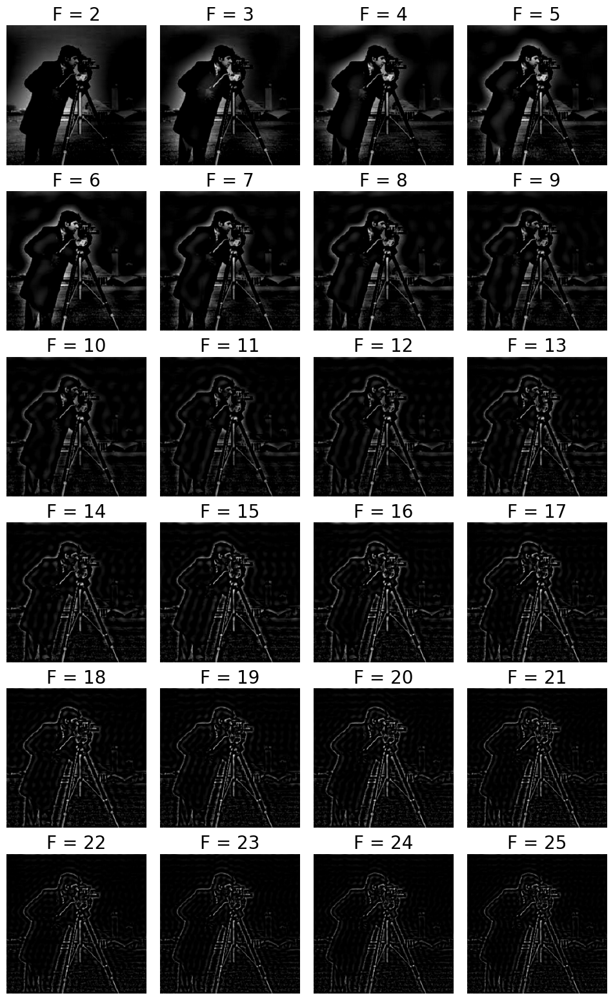

In [23]:
'''
Đoạn code sau cho thấy ứng dụng của HPF lên ảnh xám cameraman, với các giá trị
tần số cắt (frequency cut-off values) F:
'''
from scipy import fftpack
im = np.array(Image.open('../../image/cameraman.jpg').convert('L'))
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
snrs_hp = []
lbs = list(range(1,25))
pylab.figure(figsize=(12,20))

for l in lbs:
  freq1 = np.copy(freq)
  freq2 = fftpack.fftshift(freq1)
  freq2[half_w-l:half_w+l+1,half_h-l:half_h+l+1] = 0 # select all but the first lxl (low) frequencies
  im1 = np.clip(fp.ifft2(fftpack.ifftshift(freq2)).real,0,255) # clip pixel values after IFFT
  snrs_hp.append(signaltonoise(im1, axis=None))
  pylab.subplot(6,4,l), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
  pylab.title('F = ' + str(l+1), size=20)
pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

### CÁCH SNR THAY ĐỔI VỚI FREQUENCY CUT-OFF

Đoạn code sau cho thấy cách biểu diễn sự thay đổi trong tỷ lệ tín hiệu trên nhiễu (SNR) với tần số cắt (cutoff frequency) (F) cho HPF

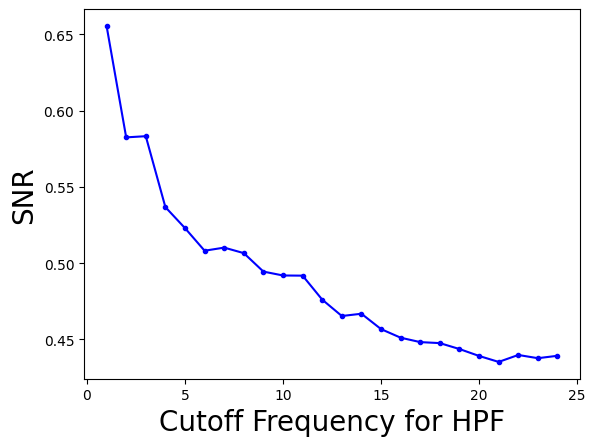

In [24]:
pylab.plot(lbs, snrs_hp, 'b.-')
pylab.xlabel('Cutoff Frequency for HPF', size=20)
pylab.ylabel('SNR', size=20)
pylab.show()

### BỘ LỌC THÔNG THẤP (LOW-PASS FILTER - LPF)

Bộ lọc này chỉ cho phép các tần số thấp từ biểu diễn miền tần số của hình ảnh (thu được bằng DFT) và chặn tất cả các tần số cao vượt quá giá trị cắt (cut-off value). Hình ảnh được tái tạo bằng DFT nghịch đảo và vì các thành phần tần số cao tương ứng với các cạnh, chi tiết, nhiễu, v.v., nên LPF có xu hướng loại bỏ chúng. Một vài phần tiếp theo sẽ trình bày cách sử dụng các hàm khác nhau từ các thư viện numpy, scipy và scikitimage để triển khai LPF và tác động của LPF lên hình ảnh.

#### LPF VỚI SCIPY NDIMAGE VÀ NUMPY FFT

Hàm fft2() của mô-đun numpy fft cũng có thể được sử dụng để chạy FFT trên một hình ảnh. Mô-đun scipy ndimage cung cấp một loạt các hàm để áp dụng LPF trên hình ảnh trong miền tần số. Phần tiếp theo sẽ trình bày một trong những bộ lọc này (cụ thể là fourier_gaussian()) với một ví dụ

#### LPF VỚI FOURIER_GAUSSIAN

Hàm này cài đặt bộ lọc nhiều chiều Gaussian Fourier. Mảng tần số được nhân với phép biến đổi Fourier của kernel Gaussian có kích thước nhất định.

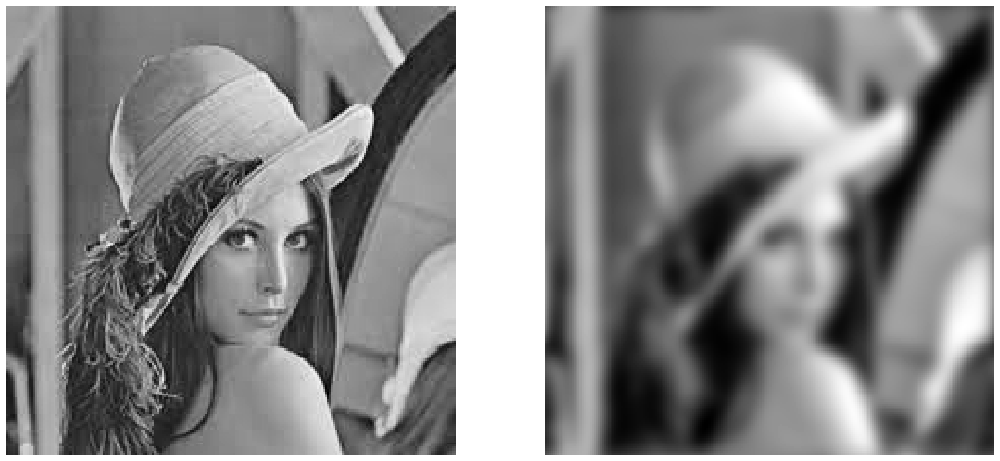

In [4]:
import numpy.fft as fp
fig, (axes1, axes2) = pylab.subplots(1, 2, figsize=(20,10))
pylab.gray() # show the result in grayscale
im = np.mean(imread('../../image/lena.jpg'), axis=2)
freq = fp.fft2(im)
freq_gaussian = ndimage.fourier_gaussian(freq, sigma=4)
im1 = fp.ifft2(freq_gaussian)
axes1.imshow(im), axes1.axis('off'), axes2.imshow(im1.real) # the imaginary part is an artifact
axes2.axis('off')
pylab.show()

Đoạn code sau hiển thị phổ tần số của hình ảnh sau khi áp dụng box kernel:

C:\Users\ACER\AppData\Local\Temp\ipykernel_24392\3182497831.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  numpy.fft.fftshift(freq_gaussian))).astype(int))


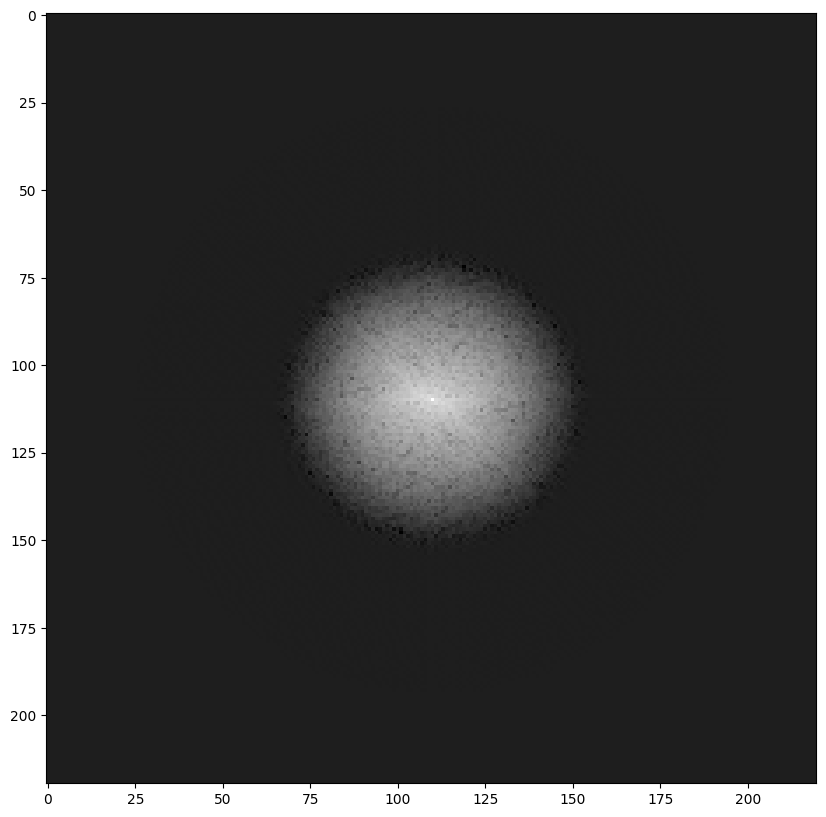

In [5]:
import numpy
pylab.figure(figsize=(10,10))
pylab.imshow( (20*np.log10( 0.1 +
numpy.fft.fftshift(freq_gaussian))).astype(int))
pylab.show()

Bức ảnh trên hiển thị phổ tần số của hình ảnh sau khi áp dụng kernel Gaussian

#### LPF VỚI SCIPY FFTPACK

Chúng ta có thể triển khai LPF trên một hình ảnh bằng các bước sau:
1. Thực hiện FFT 2D với scipy.fftpack fft2 và thu được biểu diễn miền tần số của hình ảnh
2. Chỉ giữ lại các thành phần tần số thấp (loại bỏ các thành phần tần số cao)
3. Thực hiện FFT ngược để tái tạo hình ảnh

Có thể thấy ở các ảnh chụp tiếp theo, các thành phần tần số cao tương ứng nhiều hơn với thông tin hình ảnh trung bình (phẳng); và thông tin chi tiết (ví dụ: các cạnh) của hình ảnh bị mất khi chúng ta loại bỏ ngày càng nhiều thành phần tần số cao

Ví dụ, nếu chúng ta chỉ giữ lại thành phần tần số đầu tiên và loại bỏ tất cả các thành phần khác, trong hình ảnh thu được sau khi sử dụng FFT nghịch đảo, chúng ta khó có thể nhìn thấy tê giác, nhưng khi chúng ta giữ lại ngày càng nhiều tần số cao hơn, chúng trở nên nổi bật trong hình ảnh.

2.39908689036964


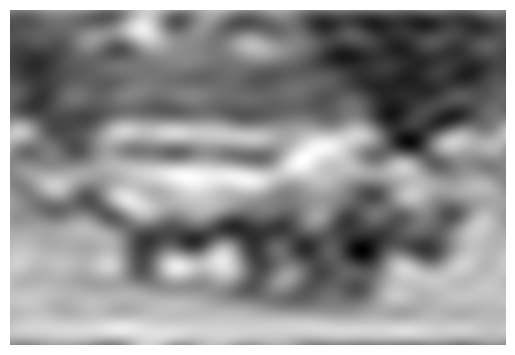

In [9]:
from scipy import fftpack
im = np.array(Image.open('../../image/rhino.jpg').convert('L'))
# low pass filter
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
freq1 = np.copy(freq)
freq2 = fftpack.fftshift(freq1)
freq2_low = np.copy(freq2)
freq2_low[half_w-10:half_w+11,half_h-10:half_h+11] = 0 # block the lowfrequencies
freq2 -= freq2_low # select only the first 20x20 (low) frequencies, block the high frequencies
im1 = fp.ifft2(fftpack.ifftshift(freq2)).real
print(signaltonoise(im1, axis=None))
# 2.389151856495427
pylab.imshow(im1, cmap='gray'), pylab.axis('off')
pylab.show()

Đoạn code tiếp theo cho thấy cách vẽ phổ của hình ảnh trong miền Logarith sau khi chặn các tần số cao (chỉ cho phép các tần số thấp)

C:\Users\ACER\AppData\Local\Temp\ipykernel_24392\2084392033.py:2: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int))


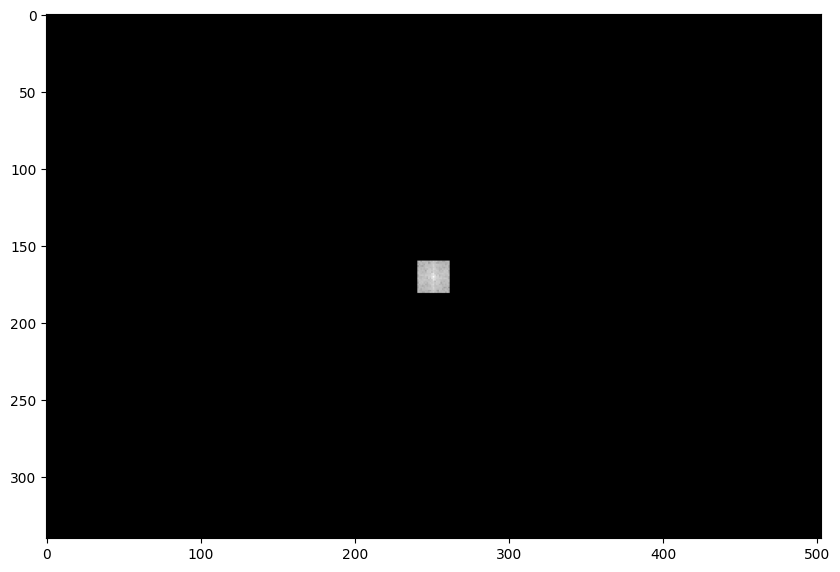

In [10]:
pylab.figure(figsize=(10,10))
pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int))
pylab.show()

Đoạn code tiếp theo cho thấy ứng dụng của LPF trên ảnh xám cameraman, với các giá trị tần số cutoff khác nhau, F:

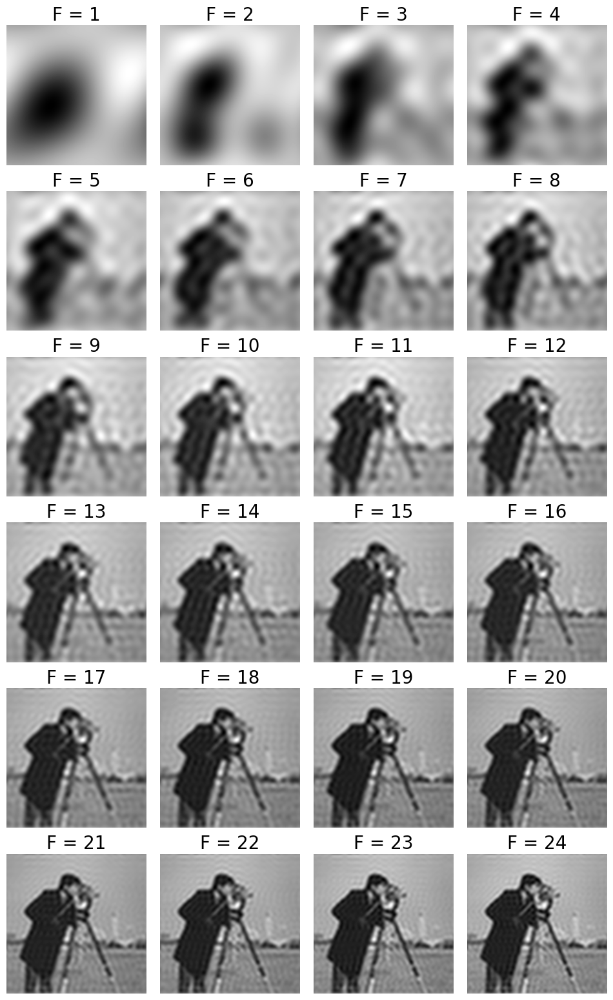

In [16]:
im = np.array(Image.open('../../image/cameraman.jpg').convert('L'))
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
snrs_lp = []
ubs = list(range(1,25))
pylab.figure(figsize=(12,20))
for u in ubs:
  freq1 = np.copy(freq)
  freq2 = fftpack.fftshift(freq1)
  freq2_low = np.copy(freq2)
  freq2_low[half_w-u:half_w+u+1,half_h-u:half_h+u+1] = 0
  freq2 -= freq2_low # select only the first 20x20 (low) frequencies
  im1 = fp.ifft2(fftpack.ifftshift(freq2)).real
  snrs_lp.append(signaltonoise(im1, axis=None))
  pylab.subplot(6,4,u), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
  pylab.title('F = ' + str(u), size=20)
pylab.subplots_adjust(wspace=0.1, hspace=0)
pylab.show()

#### SNR THAY ĐỔI THẾ NÀO VỚI TẦN SỐ CUTOFF

Khối mã sau đây cho thấy cách vẽ biểu đồ sự thay đổi trong tỷ lệ tín hiệu trên nhiễu (SNR) theo tần số cutoff (F) đối với LPF:

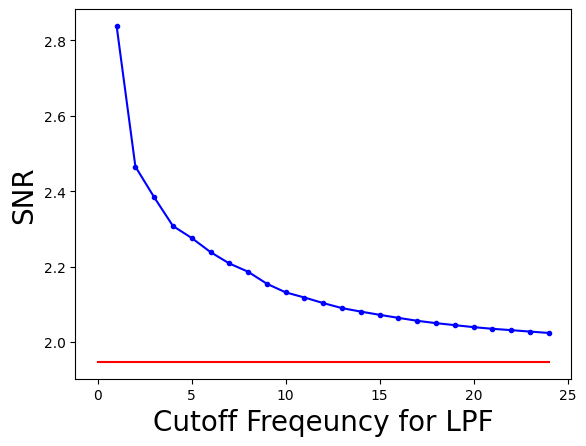

In [17]:
snr = signaltonoise(im, axis=None)
pylab.plot(ubs, snrs_lp, 'b.-')
pylab.plot(range(25), [snr]*25, 'r-')
pylab.xlabel('Cutoff Freqeuncy for LPF', size=20)
pylab.ylabel('SNR', size=20)
pylab.show()

Bức ảnh trên cho thấy SNR của hình ảnh đầu ra giảm như thế nào khi tần số cắt của LPF tăng. Đường ngang màu đỏ biểu thị SNR của hình ảnh gốc

#### BỘ LỌC THÔNG DẢI VỚI DoG

Kernel The Difference of Gaussian (DoG) có thể được sử dụng như một BPF để cho phép các tần số trong một băng tần nhất định và loại bỏ tất cả các tần số khác. Khối mã sau đây cho thấy cách kernel DoG có thể được sử dụng với fftconvolve() để triển khai BPF

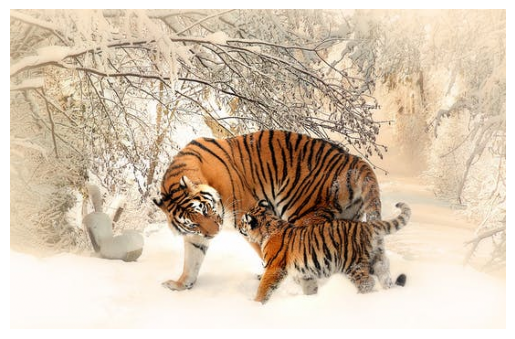

0.7832723415957195


C:\Users\ACER\AppData\Local\Temp\ipykernel_24392\2515945904.py:6: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1
C:\Users\ACER\AppData\Local\Temp\ipykernel_24392\2515945904.py:9: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1


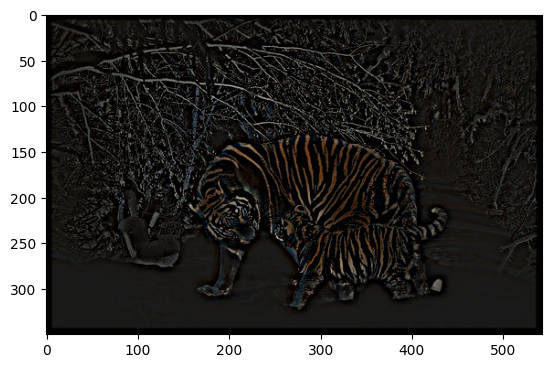

In [20]:
from skimage import img_as_float
im = img_as_float(pylab.imread('../../image/tigers.jpeg'))
pylab.figure(), pylab.imshow(im), pylab.axis('off'), pylab.show()
x = np.linspace(-10, 10, 15)
kernel_1d = np.exp(-0.005*x**2)
kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1
gauss_kernel1 = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
kernel_1d = np.exp(-5*x**2)
kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1
gauss_kernel2 = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
DoGKernel = gauss_kernel1[:, :, np.newaxis] - gauss_kernel2[:, :, np.newaxis]
im = signal.fftconvolve(im, DoGKernel, mode='same')
pylab.figure(), pylab.imshow(np.clip(im, 0, 1)), print(np.max(im)),
pylab.show()

#### BỘ LỌC CHẶN DẢI (NOTCH)

Bộ lọc này chặn/loại bỏ một số tần số được chọn từ biểu diễn miền tần số của hình ảnh (thu được bằng DFT), và do đó có tên như vậy. Nó hữu ích trong việc loại bỏ nhiễu tuần hoàn khỏi hình ảnh

#### SỬ DỤNG BỘ LỌC NOTCH ĐỂ LOẠI BỎ NHIỄU ĐỊNH KỲ KHỎI HÌNH ẢNH

Đầu tiên chúng ta sẽ thêm một số nhiễu tuần hoàn (hình sin) vào hình ảnh con vẹt để tạo ra một hình ảnh con vẹt nhiễu (điều này có thể xảy ra do nhiễu với một số tín hiệu điện) và sau đó quan sát hiệu ứng của nhiễu trong miền tần số của hình ảnh bằng cách sử dụng khối mã sau:

(340, 453)


C:\Users\ACER\AppData\Local\Temp\ipykernel_24392\1273048482.py:9: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.subplot(2,2,2), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int),
C:\Users\ACER\AppData\Local\Temp\ipykernel_24392\1273048482.py:21: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.subplot(2,2,4), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int),


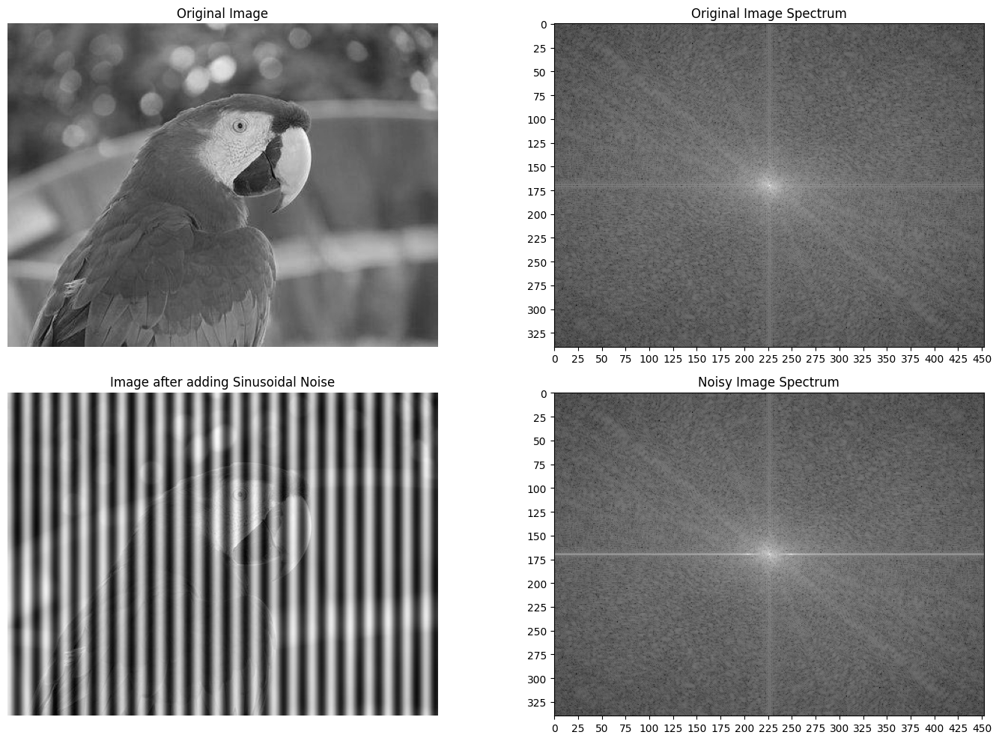

In [21]:
from scipy import fftpack
pylab.figure(figsize=(15,10))
im = np.mean(imread("../../image/parrot.png"), axis=2) / 255
print(im.shape)
pylab.subplot(2,2,1), pylab.imshow(im, cmap='gray'), pylab.axis('off')
pylab.title('Original Image')
F1 = fftpack.fft2((im).astype(float))
F2 = fftpack.fftshift( F1 )
pylab.subplot(2,2,2), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int),
cmap=pylab.cm.gray)
pylab.xticks(np.arange(0, im.shape[1], 25))
pylab.yticks(np.arange(0, im.shape[0], 25))
pylab.title('Original Image Spectrum')
# add periodic noise to the image
for n in range(im.shape[1]):
  im[:, n] += np.cos(0.1*np.pi*n)
pylab.subplot(2,2,3), pylab.imshow(im, cmap='gray'), pylab.axis('off')
pylab.title('Image after adding Sinusoidal Noise')
F1 = fftpack.fft2((im).astype(float)) # noisy spectrum
F2 = fftpack.fftshift( F1 )
pylab.subplot(2,2,4), pylab.imshow( (20*np.log10( 0.1 + F2)).astype(int),
cmap=pylab.cm.gray)
pylab.xticks(np.arange(0, im.shape[1], 25))
pylab.yticks(np.arange(0, im.shape[0], 25))
pylab.title('Noisy Image Spectrum')
pylab.tight_layout()
pylab.show()

Tiếp theo chúng ta sẽ thiết kế một bộ lọc chặn băng tần/loại bỏ băng tần (notch) để loại bỏ các tần số gây ra tiếng ồn bằng cách đặt các thành phần tần số tương ứng thành 0 trong khối mã tiếp theo:

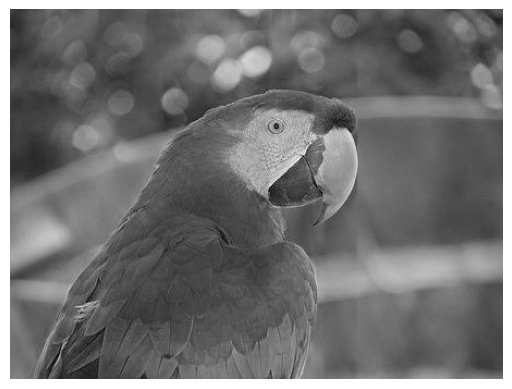

((np.float64(0.0), np.float64(1.0), np.float64(0.0), np.float64(1.0)),
 None)

In [23]:
F2[170:176,:220] = F2[170:176,230:] = 0 # eliminate the frequencies most likely responsible for noise (keep some low frequency components)
im1 = fftpack.ifft2(fftpack.ifftshift( F2 )).real
pylab.axis('off'), pylab.imshow(im1, cmap='gray'), pylab.show()

Ở ảnh trên, hình ảnh gốc trông sắc nét hơn hình ảnh được phục hồi, vì một số tần số thực từ hình ảnh gốc cùng với nhiễn cũng bị bộ lọc loại bỏ băng tần loại bỏ.

# KHÔI PHỤC HÌNH ẢNH
Trong quá trình khôi phục hình ảnh, sự suy thoái (degradation) được mô hình hóa. Điều này cho phép loại bỏ (phần lớn) các tác động của sự suy thoái. Thách thức là mất thông tin và nhiễu. Sơ đồ sau đây cho thấy mô hình suy thoái hình ảnh cơ bản:

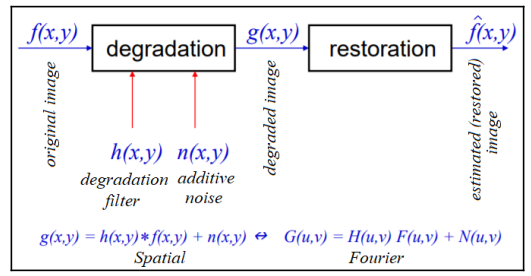

## GIẢI TÍCH CHẬP VÀ LỌC NGƯỢC VỚI FFT

Với một hình ảnh bị mờ có kernel làm mờ đã biết (giả định), một tác vụ xử lý hình ảnh điển hình là lấy lại (ít nhất là phần lớn) hình ảnh gốc. Tác vụ cụ thể này được gọi là giải tích chập (Deconvolution). Một trong những bộ lọc ngây thơ có thể được áp dụng trong miền tần số để đạt được điều này là bộ lọc nghịch đảo mà chúng ta sẽ thảo luận trong phần này. Trước tiên, hãy bắt đầu bằng cách làm mờ hình ảnh lena thang độ xám bằng cách làm mờ Gaussian bằng cách sử dụng mã sau:

In [29]:
im = 255*rgb2gray(imread('../../image/lena.jpg'))
gauss_kernel = np.outer(windows.gaussian(im.shape[0], 3),
windows.gaussian(im.shape[1], 3))
freq = fp.fft2(im)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel)) # this is our H
convolved = freq*freq_kernel # by convolution theorem
im_blur = fp.ifft2(convolved).real
im_blur = 255 * im_blur / np.max(im_blur) # normalize

Giờ ta dùng bộ lọc nghịch đảo trên ảnh bị làm mờ (Sử dụng cùng H) để lấy lại ảnh gốc trong đoạn code sau:

243.83080000000004 255.0


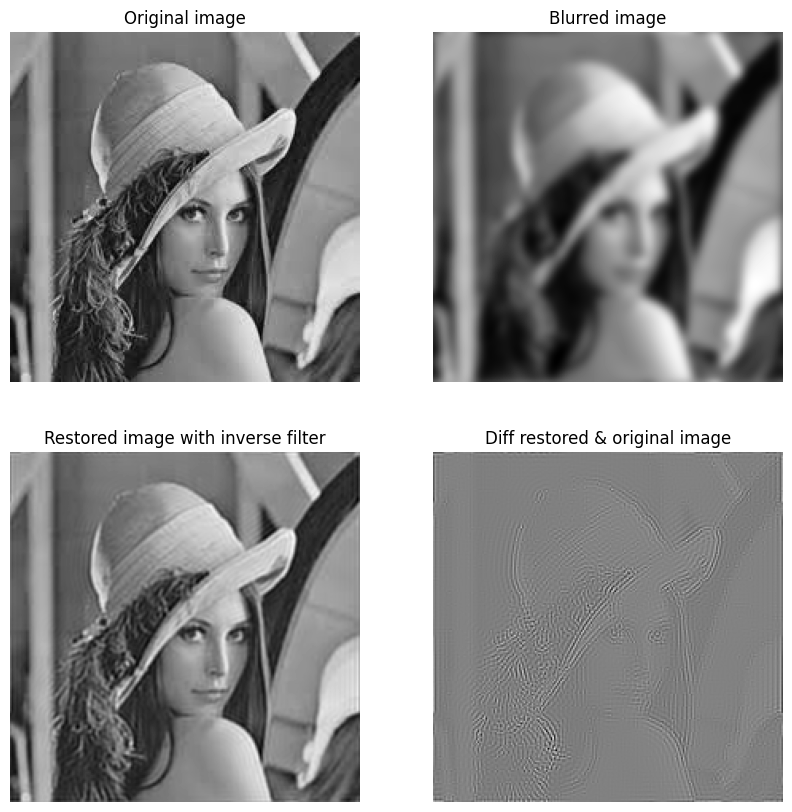

In [30]:
epsilon = 10**-6
freq = fp.fft2(im_blur)
freq_kernel = 1 / (epsilon + freq_kernel) # avoid division by zero
convolved = freq*freq_kernel
im_restored = fp.ifft2(convolved).real
im_restored = 255 * im_restored / np.max(im_restored)
print(np.max(im), np.max(im_restored))
pylab.figure(figsize=(10,10))
pylab.gray()
pylab.subplot(221), pylab.imshow(im), pylab.title('Original image'),
pylab.axis('off')
pylab.subplot(222), pylab.imshow(im_blur), pylab.title('Blurred image'),
pylab.axis('off')
pylab.subplot(223), pylab.imshow(im_restored), pylab.title('Restored image with inverse filter'), pylab.axis('off')
pylab.subplot(224), pylab.imshow(im_restored - im), pylab.title('Diff restored & original image'), pylab.axis('off')
pylab.show()

Nếu hình ảnh đầu vào bị nhiễu, bộ lọc ngược (là HPF) hoạt động kém, vì nhiễu cũng được tăng cường trong hình ảnh đầu ra.

Tương tự như vậy, chúng ta có thể khử mờ một hình ảnh bị mờ với một kernel chuyển động mờ đã biết bằng cách sử dụng bộ lọc nghịch đảo. Mã vẫn giữ nguyên; chỉ có kernel thay đổi, như được hiển thị trong mã sau. Lưu ý rằng chúng ta cần tạo một hạt nhân đệm số không (zero-padded kernel) có kích thước bằng kích thước của hình ảnh gốc trước khi chúng ta có thể áp dụng phép tích chập trong miền tần số

In [3]:
kernel_size = 21 # a 21 x 21 motion blurred kernel
mblur_kernel = np.zeros((kernel_size, kernel_size))
mblur_kernel[int((kernel_size-1)/2), :] = np.ones(kernel_size)
mblur_kernel = mblur_kernel / kernel_size
# expand the kernel by padding zeros

Bức ảnh sau cho thấy phổ tần số của kernel chuyển động mờ được định nghĩa trước đó:
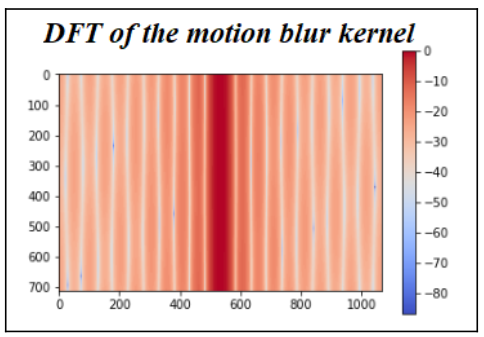

Bức ảnh sau cho thấy đầu ra của bộ lọc nghịch đảo với một bức ảnh bị làm chuyển động mờ (motion-blurred):
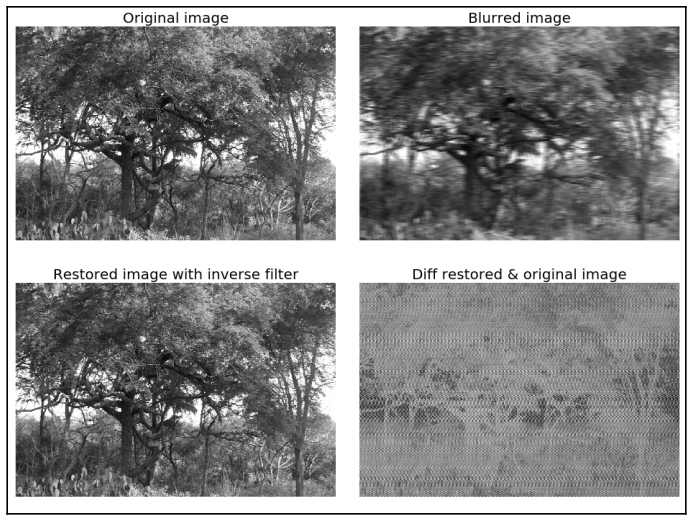

## GIẢI TÍCH CHẬP HÌNH ẢNH VỚI BỘ LỌC WIENER

Chúng ta đã thấy cách để có được hình ảnh gốc (gần đúng) từ hình ảnh bị mờ (với một hạt nhân mờ (blur kernel) đã biết) bằng cách sử dụng bộ lọc nghịch đảo trong phần trước. Một nhiệm vụ quan trọng khác trong xử lý hình ảnh là loại bỏ nhiễu từ tín hiệu bị hỏng. Đây còn được gọi là khôi phục hình ảnh. Khối mã sau đây cho thấy cách bộ lọc Wiener không giám sát của mô-đun khôi phục hình ảnh scikit có thể được sử dụng để khử nhiễu hình ảnh bằng giải tích chập:

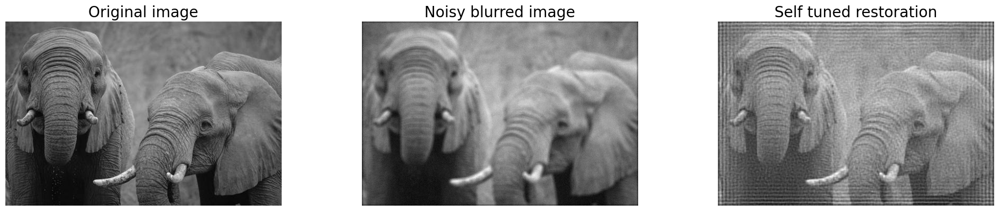

In [5]:
from skimage import color, data, restoration
im = color.rgb2gray(imread('../../image/elephant_g.jpg'))
from scipy.signal import convolve2d as conv2
n = 7
psf = np.ones((n, n)) / n**2
im1 = conv2(im, psf, 'same')
im1 += 0.1 * np.std(im1) * np.random.standard_normal(im.shape)
im2, _ = restoration.unsupervised_wiener(im1, psf)
fig, axes = pylab.subplots(nrows=1, ncols=3, figsize=(20, 4), sharex=True,
sharey=True)
pylab.gray()
axes[0].imshow(im), axes[0].axis('off'), axes[0].set_title('Original image', size=20)
axes[1].imshow(im1), axes[1].axis('off'), axes[1].set_title('Noisy blurred image', size=20)
axes[2].imshow(im2), axes[2].axis('off'), axes[2].set_title('Self tuned restoration', size=20)
fig.tight_layout()
pylab.show()

### KHỬ NHIỄU ẢNH VỚI FFT

Ví dụ tiếp theo được lấy từ http://www.scipy-lectures.org/intro/scipy/auto_examples/solutions/plot_fft_image_denoise.html. Ví dụ này trình bày cách khử nhiễu hình ảnh trước tiên bằng cách chặn các phần tử Fourier có tần số cao bằng LPF với FFT. Trước tiên, hãy hiển thị hình ảnh thang độ xám nhiễu bằng khối mã sau:

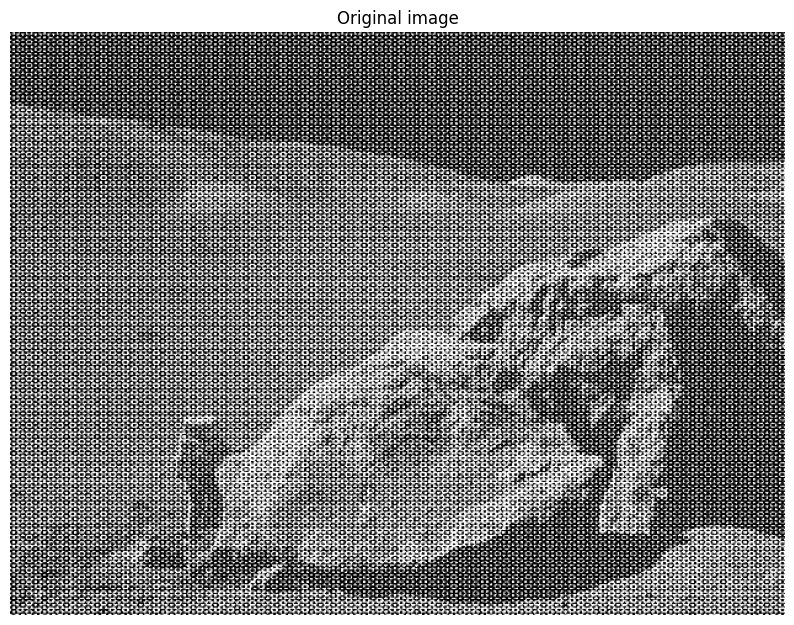

In [ ]:
'''Hình ảnh đầu ra là ảnh nhiễu'''

im = pylab.imread('../../image/moonlanding.png').astype(float)
pylab.figure(figsize=(10,10))
pylab.imshow(im, pylab.cm.gray), pylab.axis('off'), pylab.title('Original image')
pylab.show()

Text(0.5, 1.0, 'Spectrum with Fourier transform')

<Figure size 640x480 with 0 Axes>

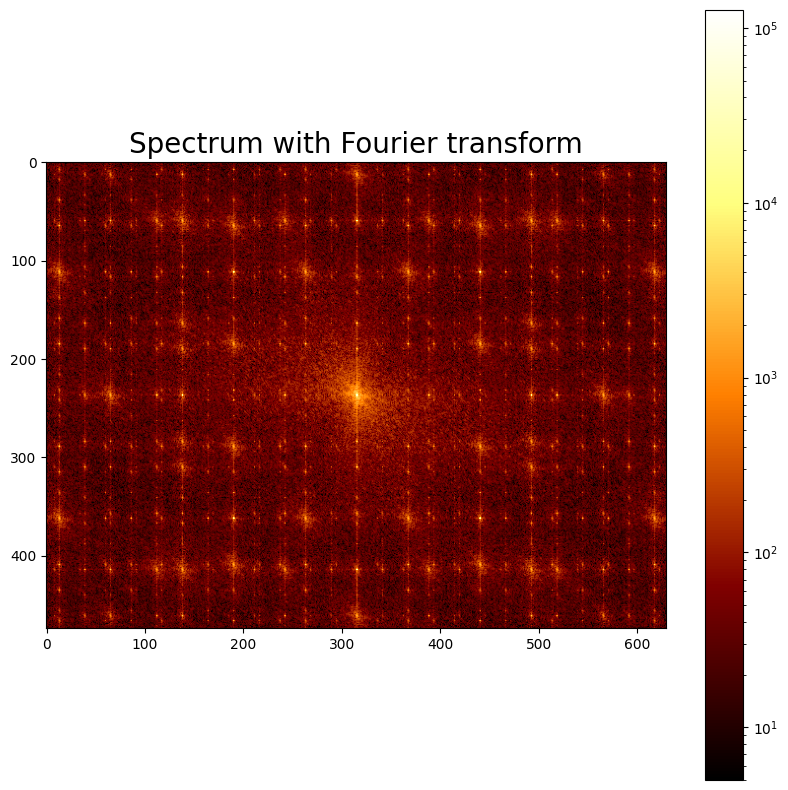

In [ ]:
'''Đoạn code này cho thấy phổ tần số của ảnh nhiễu'''

from scipy import fftpack
from matplotlib.colors import LogNorm
im_fft = fftpack.fft2(im)
def plot_spectrum(im_fft):
  pylab.figure(figsize=(10,10))
  pylab.imshow(np.abs(im_fft), norm=LogNorm(vmin=5), cmap=pylab.cm.afmhot), pylab.colorbar()
pylab.figure(), plot_spectrum(fftpack.fftshift(im_fft))
pylab.title('Spectrum with Fourier transform', size=20)

### LỌC TRONG FFT

Khối mã sau đây cho thấy cách loại bỏ một loạt tần số cao và triển khai LPF để làm giảm nhiễu (tương ứng với các thành phần tần số cao) từ hình ảnh:

(None, Text(0.5, 1.0, 'Filtered Spectrum'))

<Figure size 640x480 with 0 Axes>

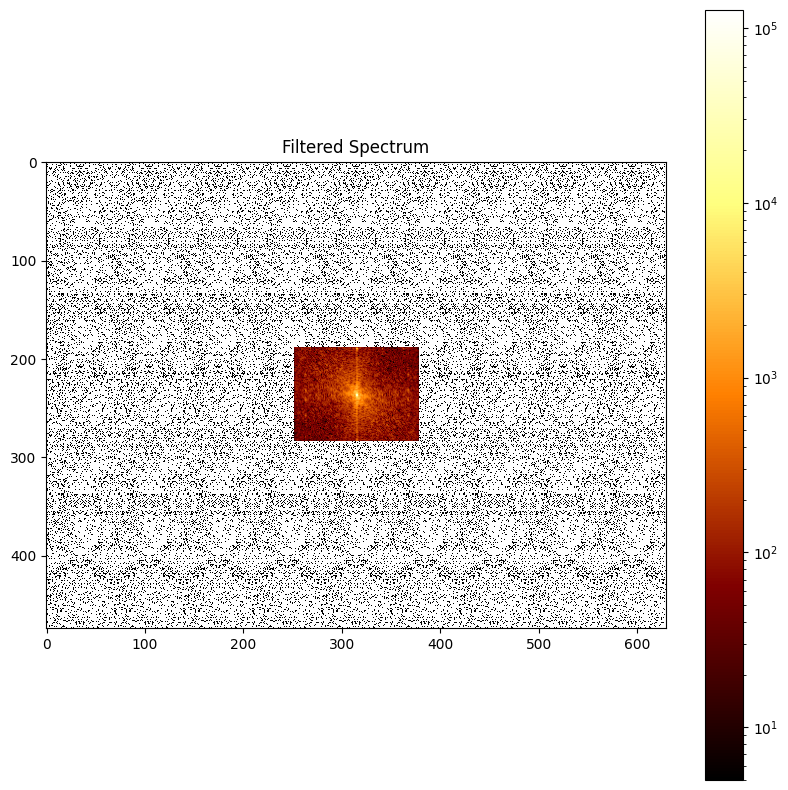

In [ ]:
'''Ảnh đầu ra là phổ được lọc với LPF'''

# Copy the original spectrum and truncate coefficients.
# Define the fraction of coefficients (in each direction) to keep as
keep_fraction = 0.1
im_fft2 = im_fft.copy()
# Set r and c to the number of rows and columns of the array.
r, c = im_fft2.shape
# Set all rows to zero with indices between r*keep_fraction and r*(1- keep_fraction)
im_fft2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0
# Similarly with the columns
im_fft2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0
pylab.figure(),
plot_spectrum(fftpack.fftshift(im_fft2)),pylab.title('Filtered Spectrum')

### PHỤC DỰNG HÌNH ẢNH

Đoạn code sau trình bày cách phục dựng hình ảnh với IFFT từ các hệ số Fourier đã lọc:

Text(0.5, 1.0, 'Reconstructed Image')

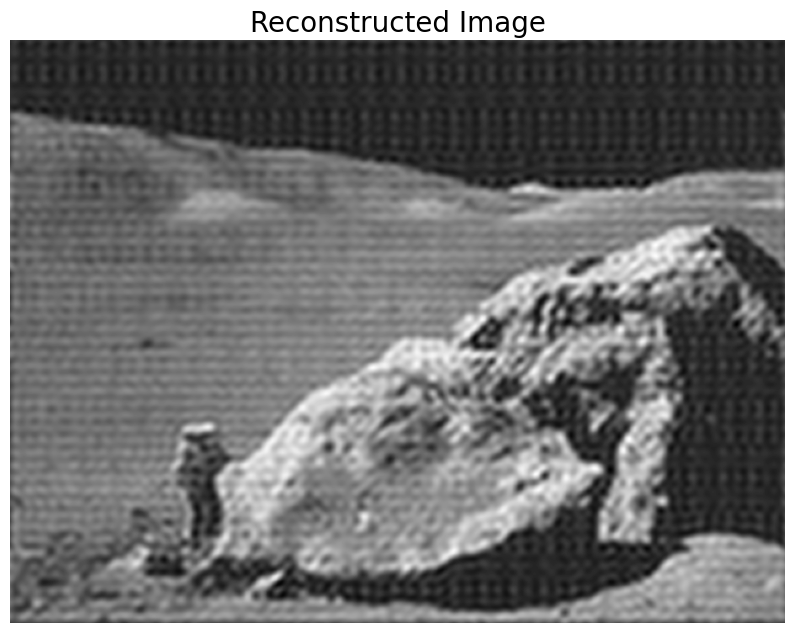

In [ ]:
'''Hình ảnh đầu ra rõ nét hơn so với ảnh gốc được lọc trong miền tần số'''

# Reconstruct the denoised image from the filtered spectrum, keep only the
# real part for display.
im_new = fp.ifft2(im_fft2).real
pylab.figure(figsize=(10,10)), pylab.imshow(im_new, pylab.cm.gray),
pylab.axis('off')
pylab.title('Reconstructed Image', size=20)

# KẾT LUẬN

Trong chương này, chúng tôi đã thảo luận một số khái niệm quan trọng chủ yếu liên quan đến tích chập 2D và các ứng dụng liên quan của nó trong xử lý hình ảnh, chẳng hạn như lọc trong miền không gian. Chúng tôi cũng thảo luận một số kỹ thuật lọc miền tần số khác nhau và minh họa chúng bằng khá nhiều ví dụ với các mô-đun scikit-image numpy fft, scipy, fftpack, signal và ndimage. Chúng tôi bắt đầu với định lý tích chập và ứng dụng của nó trong lọc miền tần số, nhiều bộ lọc miền tần số khác nhau như LPF, HPF và bộ lọc notch, và cuối cùng là giải tích chập và ứng dụng của nó trong thiết kế bộ lọc để khôi phục hình ảnh, chẳng hạn như bộ lọc đảo ngược và Wiener